In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageOps
from scipy.spatial import cKDTree
from skimage.feature import plot_matches
from skimage.measure import ransac
from skimage.transform import AffineTransform
from six import BytesIO
import tensorflow as tf
import tensorflow_hub as hub
from six.moves.urllib.request import urlopen

In [2]:
# IMAGE_1_URL = 'https://upload.wikimedia.org/wikipedia/commons/2/28/Bridge_of_Sighs%2C_Oxford.jpg'
# IMAGE_2_URL = 'https://upload.wikimedia.org/wikipedia/commons/c/c3/The_Bridge_of_Sighs_and_Sheldonian_Theatre%2C_Oxford.jpg'

# IMAGE_3_URL = 'https://upload.wikimedia.org/wikipedia/commons/1/1e/Golden_gate2.jpg'
# IMAGE_4_URL = 'https://upload.wikimedia.org/wikipedia/commons/3/3e/GoldenGateBridge.jpg'

# IMAGE_5_URL = 'https://upload.wikimedia.org/wikipedia/commons/c/ce/2006_01_21_Ath%C3%A8nes_Parth%C3%A9non.JPG'
# IMAGE_6_URL = 'https://upload.wikimedia.org/wikipedia/commons/5/5c/ACROPOLIS_1969_-_panoramio_-_jean_melis.jpg'

# IMAGE_1_JPG = 'image_1.jpg'
# IMAGE_2_JPG = 'image_2.jpg'
# IMAGE_3_JPG = 'image_3.jpg'
# IMAGE_4_JPG = 'image_4.jpg'
# IMAGE_5_JPG = 'image_5.jpg'
# IMAGE_6_JPG = 'image_6.jpg'
urlList=['http://lh4.ggpht.com/-_X7nI-75w8g/SgMLSQSXDgI/AAAAAAAABns/YZjlL9lgu98/s1600/'
    ,'http://lh6.ggpht.com/-r1LjRS9oOvM/S5AP9aYUj7I/AAAAAAAACW4/9-zRL-rwY40/s1600/'
    ,'http://lh4.ggpht.com/-Q0dIIT0LWEQ/R3J24z32yTI/AAAAAAAABR0/PbLYcD3k7Es/s1600/'
    
    ,'http://lh4.ggpht.com/-TcsUKA57m6s/RySqlnGdq_I/AAAAAAAAAWA/d1ch-NJLzE4/s1600/'
    ,'http://lh3.ggpht.com/-xpk9kRpv65o/ToGbE6Vi4_I/AAAAAAAABA0/Smxe9XqC4qY/s1600/'
    ,'https://lh4.googleusercontent.com/-9pL3NosFgKQ/TOKArK4l7fI/AAAAAAAAOv8/GyqxhDyJdSU/s1600/'
    ,'https://lh6.googleusercontent.com/-KmY65KLxSlk/TcUSPEMs44I/AAAAAAAAAwY/pjYvePK5Zlk/s1600/'
    ,'http://lh4.ggpht.com/-q4t2BCB-5hk/S59ETA-o0CI/AAAAAAAAALg/afSaIOMnwGw/s1600/'
    ,'https://lh6.googleusercontent.com/-2M8kBxuyWMU/SLbLfW-y3vI/AAAAAAAAE7Q/fsdcJLPXsiY/rj/'
    ,'http://lh3.ggpht.com/-3ob6Pa7Aiu0/UDh3TnBcG3I/AAAAAAAAA6I/lKgRruC7Ong/s1600/'
    ,'https://lh3.googleusercontent.com/-Mgkb8Va9ayI/SAVXzwtyzeI/AAAAAAAAAPY/1KD_1g1Yq4k/s1600/'
    ,'http://lh4.ggpht.com/-2zdTCqGo4CA/SDHpLHEi2AI/AAAAAAAAAMQ/1Uakql_tdtw/s1600/'
    ,'http://lh3.ggpht.com/-hP1wucB9gBk/RpEiQEWhpRI/AAAAAAAAAHY/N9uSvByOiuI/s1600/'
    ,'https://lh6.googleusercontent.com/-Ukxww5bktU8/SPiBCG_JFdI/AAAAAAAAAJM/uzNdS0Jnkas/s1600/'
    
    ,'https://lh4.googleusercontent.com/-bKUHIHec-o4/UgOKOnF6QQI/AAAAAAAAEhM/HCkBXm41ZW8/s1600/'
    ,'http://lh5.ggpht.com/-Dgd-SG5HB7w/SJYZzEcui-I/AAAAAAAAAUs/QVyPTDjn3Rw/s1600/'
    ,'https://lh4.googleusercontent.com/JB_WIf7JSwUgCJSqYX2mdowD2Z0WtVQjFRg-Ptp-vD0'
    ,'https://lh5.googleusercontent.com/-fdumkstv_9c/TE6nC3DfsvI/AAAAAAAAApQ/tNXbiWbHMck/s1600/'
    ,'https://lh6.googleusercontent.com/-5nmIWJ8b568/ULoOP0eYEcI/AAAAAAAA1Qs/K2eCxOvT6x0/s1600/'
    ,'http://lh5.ggpht.com/-CzewCaiozeQ/Sk2q1_qM6_I/AAAAAAAAHwI/Hqly61za1Co/s1600/'
    ,'http://lh6.ggpht.com/-5Zoo5IT-wXc/SUNtnObad8I/AAAAAAAAAXk/r4gTKnJkWX4/s1600/'
    ,'https://lh4.googleusercontent.com/-0-AuRsvSLRk/TlU93a09IeI/AAAAAAAABjI/2vO6pmkQB8g/s1600/'
    ,'https://lh6.googleusercontent.com/-OxCxBKnDKfc/SHTr4EO9ZUI/AAAAAAAABEk/HyaXrKy0apY/s1600/'
    ,'http://lh3.ggpht.com/-DsAMtI4g2fY/Shy3HGvuHiI/AAAAAAAAA70/0sDR7EZRMOE/s1600/'
    ,'https://lh6.googleusercontent.com/-iHhBb06T1Xw/STKyuVBqzSI/AAAAAAAACUM/e-gUHXJ5z-s/s1600/'
    ,'https://lh3.googleusercontent.com/-dCpP7rjpE_Q/R_HmaxNeNWI/AAAAAAAAA2Y/IlBUbSuy7Qo/s1600/'
    ,'http://lh4.ggpht.com/-8zxgTTvir48/SIWLnI-ur7I/AAAAAAAAA14/8PG0r3N8GB4/s1600/']

imageList=[]
for i in range(len(urlList)-1):
    imageList.append('image_'+str(i+1)+'.jpg')

#urlList=[IMAGE_1_URL,IMAGE_2_URL,IMAGE_3_URL,IMAGE_4_URL,IMAGE_5_URL,IMAGE_6_URL]
#imageList=[IMAGE_1_JPG, IMAGE_2_JPG, IMAGE_3_JPG, IMAGE_4_JPG, IMAGE_5_JPG, IMAGE_6_JPG]

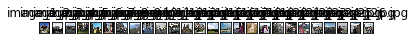

In [3]:
def download_and_resize_image(url, filename, new_width=256, new_height=256):
    response = urlopen(url)
    image_data = response.read()
    pil_image = Image.open(BytesIO(image_data))
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
    pil_image_rgb = pil_image.convert('RGB')
    pil_image_rgb.save(filename, format='JPEG', quality=90)

for i in range(len(imageList)-1):
    try:
        download_and_resize_image(urlList[i],imageList[i])
    except:
        print('page not found',i)

def show_images(image_path_list):
    plt.figure()
    for i, image_path in enumerate(image_path_list):
        plt.subplot(1, len(image_path_list), i+1)
        plt.imshow(np.asarray(Image.open(image_path)))
        plt.title(image_path)
        plt.grid(False)
        plt.yticks([])
        plt.xticks([])
    plt.show()

show_images(imageList)

In [4]:
def image_input_fn():
    filename_queue = tf.train.string_input_producer(
     imageList, shuffle=False)
    reader = tf.WholeFileReader()
    _, value = reader.read(filename_queue)
    image_tf = tf.image.decode_jpeg(value, channels=3)
    return tf.image.convert_image_dtype(image_tf, tf.float32)

In [5]:
tf.reset_default_graph()
tf.logging.set_verbosity(tf.logging.FATAL)

m = hub.Module('https://tfhub.dev/google/delf/1')

# The module operates on a single image at a time, so define a placeholder to
# feed an arbitrary image in.
image_placeholder = tf.placeholder(
    tf.float32, shape=(None, None, 3), name='input_image')

module_inputs = {
    'image': image_placeholder,
    'score_threshold': 100.0,
    'image_scales': [0.25, 0.3536, 0.5, 0.7071, 1.0, 1.4142, 2.0],
    'max_feature_num': 1000,
}

module_outputs = m(module_inputs, as_dict=True)

image_tf = image_input_fn()

with tf.train.MonitoredSession() as sess:
    results_dict = {}  # Stores the locations and their descriptors for each image
    for image_path in imageList:
        image = sess.run(image_tf)
        print('Extracting locations and descriptors from %s' % image_path)
        results_dict[image_path] = sess.run(
            [module_outputs['locations'], module_outputs['descriptors']],
            feed_dict={image_placeholder: image})

Extracting locations and descriptors from image_1.jpg
Extracting locations and descriptors from image_2.jpg
Extracting locations and descriptors from image_3.jpg
Extracting locations and descriptors from image_4.jpg
Extracting locations and descriptors from image_5.jpg
Extracting locations and descriptors from image_6.jpg
Extracting locations and descriptors from image_7.jpg
Extracting locations and descriptors from image_8.jpg
Extracting locations and descriptors from image_9.jpg
Extracting locations and descriptors from image_10.jpg
Extracting locations and descriptors from image_11.jpg
Extracting locations and descriptors from image_12.jpg
Extracting locations and descriptors from image_13.jpg
Extracting locations and descriptors from image_14.jpg
Extracting locations and descriptors from image_15.jpg
Extracting locations and descriptors from image_16.jpg
Extracting locations and descriptors from image_17.jpg
Extracting locations and descriptors from image_18.jpg
Extracting location

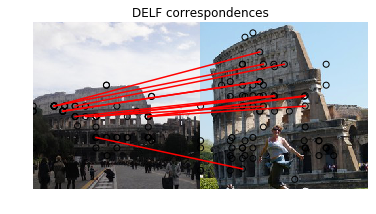

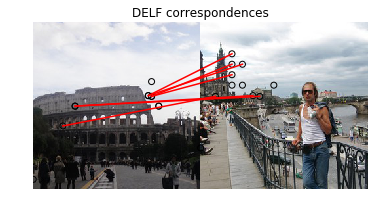

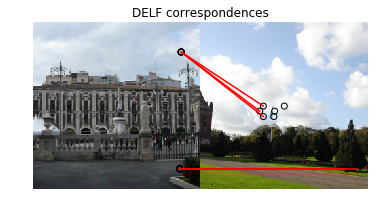

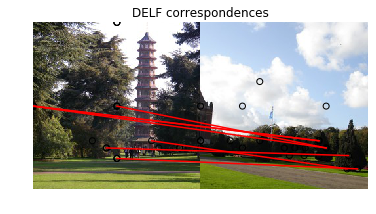

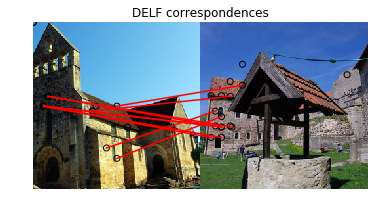

...

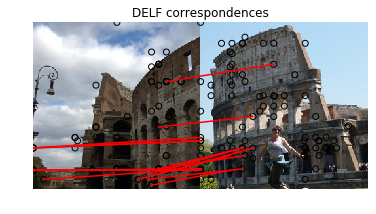

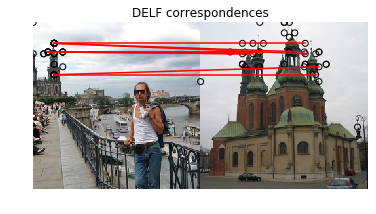

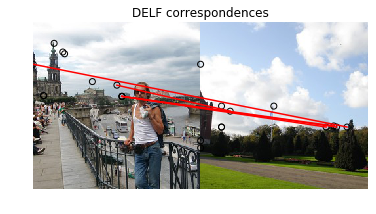

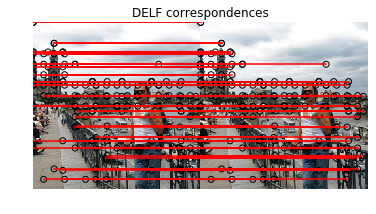

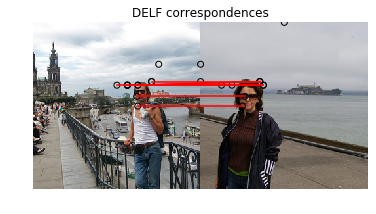

In [10]:
def match_images(results_dict, image_1_path, image_2_path):
    distance_threshold = 0.8

    # Read features.
    locations_1, descriptors_1 = results_dict[image_1_path]
    num_features_1 = locations_1.shape[0]
    #print("Loaded image 1's %d features" % num_features_1)
    locations_2, descriptors_2 = results_dict[image_2_path]
    num_features_2 = locations_2.shape[0]
   # print("Loaded image 2's %d features" % num_features_2)

    # Find nearest-neighbor matches using a KD tree.
    d1_tree = cKDTree(descriptors_1)
    _, indices = d1_tree.query(
      descriptors_2, distance_upper_bound=distance_threshold)

    # Select feature locations for putative matches.
    locations_2_to_use = np.array([
      locations_2[i,]
      for i in range(num_features_2)
      if indices[i] != num_features_1
    ])
    locations_1_to_use = np.array([
      locations_1[indices[i],]
      for i in range(num_features_2)
      if indices[i] != num_features_1
    ])

    # Perform geometric verification using RANSAC.
    _, inliers = ransac(
      (locations_1_to_use, locations_2_to_use),
      AffineTransform,
      min_samples=3,
      residual_threshold=20,
      max_trials=10)
#     if inliers is not None:
#         print('Found %d inliers' % sum(inliers))
#     else:
#         print('No inliers found')

    # Visualize correspondences.
   
    
    if sum(inliers)>0.02*(num_features_1+num_features_2):
        
        _, ax = plt.subplots()
        img_1 = mpimg.imread(image_1_path)
        img_2 = mpimg.imread(image_2_path)
        inlier_idxs = np.nonzero(inliers)[0]
        plot_matches(
          ax,
          img_1,
          img_2,
          locations_1_to_use,
          locations_2_to_use,
          np.column_stack((inlier_idxs, inlier_idxs)),
          matches_color='r')
    
        ax.axis('off')
        ax.set_title('DELF correspondences')
    return sum(inliers),num_features_1,num_features_2

#match_images(results_dict, IMAGE_3_JPG, IMAGE_5_JPG)
for item in imageList:
    for item2 in imageList:
        if item!=item2:
            try:
                i,num_features_1,num_features_2=match_images(results_dict, item, item2)
            except:
                continue 

In [7]:
import pandas as pd
train_df = pd.read_csv('../input/train.csv')
train_df.sample(5)

FileNotFoundError: [Errno 2] File b'../input/train.csv' does not exist: b'../input/train.csv'

In [ ]:
for _, (c_id, c_df) in zip(range(3), train_df.groupby('landmark_id')):
    print(c_id)
    # take the first 2 urls
    url_1, url_2, *_ = c_df['url'].values
    download_and_resize_image(url_1, IMAGE_1_JPG)
    download_and_resize_image(url_2, IMAGE_2_JPG)
    with tf.train.MonitoredSession() as sess:
        results_dict = {}  # Stores the locations and their descriptors for each image
        for image_path in [IMAGE_1_JPG, IMAGE_2_JPG]:
            image = sess.run(image_tf)
            print('Extracting locations and descriptors from %s' % image_path)
            results_dict[image_path] = sess.run(
                [module_outputs['locations'], module_outputs['descriptors']],
                feed_dict={image_placeholder: image})
    match_images(results_dict, IMAGE_1_JPG, IMAGE_2_JPG)